# Data exploration with sentence similarity

A lot of work in Natural Language Processing involves data exploration. For example, you've collected a new corpus of texts and you want to see what it contains. In this notebook, we'll introduce three techniques that are particularly well-suited for this purpose: data visualization, sentence similarity and sentence clustering. 

Work with a corpus of movie dialogues. This is an interesting resource for any NLP application with a conversational component, such as a chatbot. The techniques below will help us better understand what data it contains.

## Data

In [1]:
!pip install kaggle
!kaggle datasets download -d Cornell-University/movie-dialog-corpus

movie-dialog-corpus.zip: Skipping, found more recently modified local copy (use --force to force download)


In [2]:
!mkdir data/movie-dialog-corpus/
!unzip -o movie-dialog-corpus.zip -d data/movie-dialog-corpus/

mkdir: data/movie-dialog-corpus/: File exists
Archive:  movie-dialog-corpus.zip
  inflating: data/movie-dialog-corpus/README.txt  
  inflating: data/movie-dialog-corpus/movie_characters_metadata.tsv  
  inflating: data/movie-dialog-corpus/movie_conversations.tsv  
  inflating: data/movie-dialog-corpus/movie_lines.tsv  
  inflating: data/movie-dialog-corpus/movie_titles_metadata.tsv  
  inflating: data/movie-dialog-corpus/raw_script_urls.tsv  


In [3]:
import csv
import random

f = "data/movie-dialog-corpus/movie_lines.tsv"

texts = []
with open(f) as i:
    csv_reader = csv.reader(i, delimiter="\t")
    for line in csv_reader:
        texts.append(line[-1])
    
random.seed(1)
random.shuffle(texts)
texts = texts[:10000]
texts[:10]

["And what have I done to her besides not buy her a new fur coat lately?  Sidney you were right -- the boy's a dilly.",
 'How many with you?',
 'Yes for both.',
 'We know...  Send the book to evidence...',
 'Oh god...',
 'I bet you could do a book.',
 "Hello?  It's just me and you again.",
 'Yes I do.  I found your file.  I know what happened.',
 "I don't think we have anything for you here.  You're obviously in the wrong place.",
 'They look nice.']

## Sentence embeddings

In [4]:
import tensorflow_hub as hub
import tensorflow as tf
import numpy as np

tf.logging.set_verbosity(tf.logging.ERROR)
embed = hub.Module("https://tfhub.dev/google/universal-sentence-encoder/2")


def embed_texts(texts):

    # Reduce logging output.
    tf.logging.set_verbosity(tf.logging.ERROR)

    with tf.Session() as session:
        session.run([tf.global_variables_initializer(), tf.tables_initializer()])
        embeddings = session.run(embed(texts))

    return np.array(embeddings).tolist()

embeddings = embed_texts(texts)

## Visualization

In [5]:
from sklearn.manifold import TSNE

mapped_embeddings = TSNE(n_components=2, metric='cosine', init='pca').fit_transform(embeddings)

Now we have reduced the dimensionality to two we're ready to visualize the texts. We give the x and y coordinates of all 2-dimensional embeddings to Matploblib's `scatter` method, which produces a scatterplot with points in the right locations. Additionally, we annotate all points with the corresponding texts, to aid our interpretation of the graph. To keep the results more or less readable, we'll print the 20 first characters only.

The scatterplot shows that the embeddings capture sentence meaning quite succesfully. For example, we observe a "thankfulness" cluster at around 4 o'clock, and a "what's that?" cluster at 12 o'clock. The embeddings capture more than just the words in the sentences: otherwise "we appreciate your help" would not be similar to "thank you". 

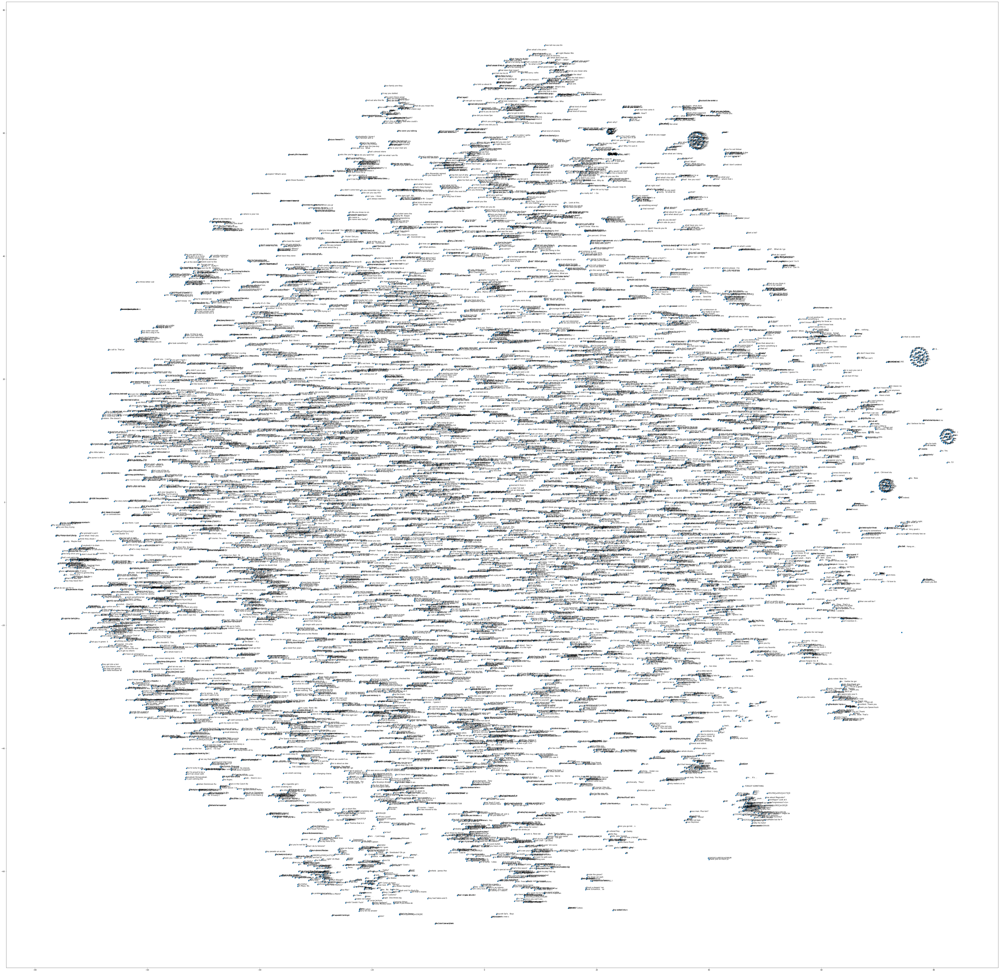

In [6]:
%matplotlib inline

import matplotlib.pyplot as plt

plt.figure(figsize=(100,100))
x = mapped_embeddings[:,0]
y = mapped_embeddings[:,1]
plt.scatter(x, y)

for i, txt in enumerate(texts):
    plt.annotate(txt[:20], (x[i], y[i]))

## Similarity

In [7]:
import re

embedding_file = "sentence_embeddings.kv"
with open(embedding_file, "w") as o:
    o.write(f'{len(embeddings)} {len(embeddings[0])}\n')
    for text, embedding in zip(texts[:len(embeddings)], embeddings):
        text = re.sub("\s+", "_", text)
        string_embedding = " ".join([str(v) for v in embedding])
        o.write(f'{text} {string_embedding}\n')

In [8]:
from gensim.models import KeyedVectors

sentence_vectors = KeyedVectors.load_word2vec_format('sentence_embeddings.kv', binary=False)

In [9]:
sentence_vectors.most_similar(positive=["Hello."])

/Users/yvespeirsman/anaconda3/lib/python3.6/site-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


[('Hello?', 1.0),
 ('Hi.', 0.9402775764465332),
 ('Hey!_-', 0.9239135384559631),
 ('Hey!', 0.9239135384559631),
 ('Hey.', 0.9239135384559631),
 ('Oh_hi!', 0.8744992017745972),
 ('Hello_there_Picart.', 0.8689433336257935),
 ('Oh_hello.', 0.8454878330230713),
 ('Hey_mister.', 0.7710813283920288),
 ("Okay._Let's_do_me.", 0.7594740390777588)]

## Clustering

In [10]:
from sklearn.cluster import AgglomerativeClustering

clusterer = AgglomerativeClustering(n_clusters=1000, affinity="euclidean", linkage="ward")
clusters = clusterer.fit_predict(embeddings)

Some random clusters will allow us to evaluate the output. Cluster 200 contains a number of greetings, cluster has many who-questions, and in cluster 800 people ask for explanation. 

In [16]:
import pandas as pd

df = pd.DataFrame({"text": texts, "cluster": clusters})

for cl in [200, 500, 800]: 
    print(df.loc[df['cluster'] == cl])

                                     text  cluster
806                              Hey man.      200
1559                    Hello Exposition.      200
2036                  Oh. Hi how y'doing?      200
2051                         Hello Peter.      200
2656           Yeah... How ya doin' Pete?      200
3336               Hiya Freddie Corleone.      200
3547                             Hey kid.      200
3790                          Hey mister.      200
4158                            Hey man--      200
4242                            Oh hello.      200
4677                     Oh Mr. Den-n-by!      200
5277                  Hey!  Mr. big shot.      200
5781             Good evening Mr. deWitt.      200
6051                  Hello. Hello Maria.      200
6380                       Hello Marylin.      200
7473              Hey Sonny - You did it!      200
7500  Hey lcokit:  <u>any</u> business...      200
8278                            Hey Pete.      200
8489                  Hello the

# Conclusions

In this notebook, I've presented some methods for data exploration. Although people often treat a corpus as a black box of data to train an NLP system on, it's always a good idea to eyeball the data. Data visualization methods, sentence similarities and clustering approaches can give us a better understanding of the texts we're dealing with. This in turn will help us build more robust NLP models that take into account the intricacies of the data and are better able to generalize to unseen examples.